In [1]:
import pandas as pd
import numpy as np

In [2]:
df=pd.read_excel('Data_Train.xlsx')

In [3]:
pd.set_option('display.max_rows',None)

In [4]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302


In [5]:
df.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

Since the null values are almost negligible we can drop them

In [6]:
df.dropna(inplace=True)

In [7]:
df['Total_Stops'].unique()

array(['non-stop', '2 stops', '1 stop', '3 stops', '4 stops'],
      dtype=object)

In [8]:
df['Total_Stops'].value_counts()

1 stop      5625
non-stop    3491
2 stops     1520
3 stops       45
4 stops        1
Name: Total_Stops, dtype: int64

In [9]:
dict1={'non-stop':0,'1 stop':1,'2 stops':2,'3 stops':3,'4 stops':4}
df=df.replace({'Total_Stops':dict1})

In [10]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,0,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1,No info,13302


Since the route and the total stops are related route could be dropped

In [11]:
df.drop('Route',axis=1,inplace=True)

In [12]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,22:20,01:10 22 Mar,2h 50m,0,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,05:50,13:15,7h 25m,2,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,09:25,04:25 10 Jun,19h,2,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,18:05,23:30,5h 25m,1,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,16:50,21:35,4h 45m,1,No info,13302


lets convert duration into minutes

In [13]:
def duration(df,variable):
   
    list1=df[variable]
    final_list=[]
    for i in list1:
        s=1
        z=i.split()
        if len(z)!=2:
            if 'h' in z[0]:
                z[0]=z[0].strip('h')
                s=(s*int(z[0]))*60
                final_list.append(s)
            else:
                z[0]=z[0].strip('m')
                s=s*int(z[0])
                final_list.append(s)
        else:
            for i in range(len(z)):
                if 'h' in z[i]:
                    z[i]=z[i].strip('h')
                    
                else:
                    z[i]=z[i].strip('m')
                    
            s=(s*int(z[0])*60)+int(z[1])
            final_list.append(s)
    return final_list
                
    

In [14]:
final_list=duration(df,'Duration')

In [15]:
len(final_list)

10682

In [16]:
df.shape

(10682, 10)

In [17]:
df['dur_min']=pd.DataFrame(final_list)

In [18]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,dur_min
0,IndiGo,24/03/2019,Banglore,New Delhi,22:20,01:10 22 Mar,2h 50m,0,No info,3897,170.0
1,Air India,1/05/2019,Kolkata,Banglore,05:50,13:15,7h 25m,2,No info,7662,445.0
2,Jet Airways,9/06/2019,Delhi,Cochin,09:25,04:25 10 Jun,19h,2,No info,13882,1140.0
3,IndiGo,12/05/2019,Kolkata,Banglore,18:05,23:30,5h 25m,1,No info,6218,325.0
4,IndiGo,01/03/2019,Banglore,New Delhi,16:50,21:35,4h 45m,1,No info,13302,285.0


In [19]:
df.drop('Duration',axis=1,inplace=True)

In [20]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Dep_Time,Arrival_Time,Total_Stops,Additional_Info,Price,dur_min
0,IndiGo,24/03/2019,Banglore,New Delhi,22:20,01:10 22 Mar,0,No info,3897,170.0
1,Air India,1/05/2019,Kolkata,Banglore,05:50,13:15,2,No info,7662,445.0
2,Jet Airways,9/06/2019,Delhi,Cochin,09:25,04:25 10 Jun,2,No info,13882,1140.0
3,IndiGo,12/05/2019,Kolkata,Banglore,18:05,23:30,1,No info,6218,325.0
4,IndiGo,01/03/2019,Banglore,New Delhi,16:50,21:35,1,No info,13302,285.0


Taking care of the departure time

In [21]:
df['dep_hr']=pd.to_datetime(df['Dep_Time'],format='%H:%M').dt.hour

In [22]:
df['dep_min']=pd.to_datetime(df['Dep_Time'],format='%H:%M').dt.minute

In [23]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Dep_Time,Arrival_Time,Total_Stops,Additional_Info,Price,dur_min,dep_hr,dep_min
0,IndiGo,24/03/2019,Banglore,New Delhi,22:20,01:10 22 Mar,0,No info,3897,170.0,22,20
1,Air India,1/05/2019,Kolkata,Banglore,05:50,13:15,2,No info,7662,445.0,5,50
2,Jet Airways,9/06/2019,Delhi,Cochin,09:25,04:25 10 Jun,2,No info,13882,1140.0,9,25
3,IndiGo,12/05/2019,Kolkata,Banglore,18:05,23:30,1,No info,6218,325.0,18,5
4,IndiGo,01/03/2019,Banglore,New Delhi,16:50,21:35,1,No info,13302,285.0,16,50


In [24]:
df.drop('Dep_Time',axis=1,inplace=True)

Taking care of arrival time

In [25]:
df['arr_hr']=pd.to_datetime(df['Arrival_Time']).dt.hour

In [26]:
df['arr_min']=pd.to_datetime(df['Arrival_Time']).dt.minute

In [27]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Arrival_Time,Total_Stops,Additional_Info,Price,dur_min,dep_hr,dep_min,arr_hr,arr_min
0,IndiGo,24/03/2019,Banglore,New Delhi,01:10 22 Mar,0,No info,3897,170.0,22,20,1,10
1,Air India,1/05/2019,Kolkata,Banglore,13:15,2,No info,7662,445.0,5,50,13,15
2,Jet Airways,9/06/2019,Delhi,Cochin,04:25 10 Jun,2,No info,13882,1140.0,9,25,4,25
3,IndiGo,12/05/2019,Kolkata,Banglore,23:30,1,No info,6218,325.0,18,5,23,30
4,IndiGo,01/03/2019,Banglore,New Delhi,21:35,1,No info,13302,285.0,16,50,21,35


In [28]:
df.drop('Arrival_Time',axis=1,inplace=True)

Now, we will deal with Date_of_Journey

In [29]:
df['journey_date_date']=pd.to_datetime(df['Date_of_Journey'],format='%d/%m/%Y').dt.day

In [30]:
df['journey_date_month']=pd.to_datetime(df['Date_of_Journey'],format='%d/%m/%Y').dt.month

The value of the year is only 2019 so it does not have to be taken care of

In [31]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Total_Stops,Additional_Info,Price,dur_min,dep_hr,dep_min,arr_hr,arr_min,journey_date_date,journey_date_month
0,IndiGo,24/03/2019,Banglore,New Delhi,0,No info,3897,170.0,22,20,1,10,24,3
1,Air India,1/05/2019,Kolkata,Banglore,2,No info,7662,445.0,5,50,13,15,1,5
2,Jet Airways,9/06/2019,Delhi,Cochin,2,No info,13882,1140.0,9,25,4,25,9,6
3,IndiGo,12/05/2019,Kolkata,Banglore,1,No info,6218,325.0,18,5,23,30,12,5
4,IndiGo,01/03/2019,Banglore,New Delhi,1,No info,13302,285.0,16,50,21,35,1,3


In [32]:
df.drop('Date_of_Journey',axis=1,inplace=True)

In [33]:
df.head()

,Airline,Source,Destination,Total_Stops,Additional_Info,Price,dur_min,dep_hr,dep_min,arr_hr,arr_min,journey_date_date,journey_date_month
0,IndiGo,Banglore,New Delhi,0,No info,3897,170.0,22,20,1,10,24,3
1,Air India,Kolkata,Banglore,2,No info,7662,445.0,5,50,13,15,1,5
2,Jet Airways,Delhi,Cochin,2,No info,13882,1140.0,9,25,4,25,9,6
3,IndiGo,Kolkata,Banglore,1,No info,6218,325.0,18,5,23,30,12,5
4,IndiGo,Banglore,New Delhi,1,No info,13302,285.0,16,50,21,35,1,3


In [34]:
df['Airline'].value_counts()

Jet Airways                          3849
IndiGo                               2053
Air India                            1751
Multiple carriers                    1196
SpiceJet                              818
Vistara                               479
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64

Since the cardinality is low in Airline feature we can use on hot encoding

In [35]:
airline=pd.get_dummies(df['Airline'],drop_first=True)

In [36]:
airline

,Air India,GoAir,IndiGo,Jet Airways,Jet Airways Business,Multiple carriers,Multiple carriers Premium economy,SpiceJet,Trujet,Vistara,Vistara Premium economy
0,0,0,1,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,0
6,0,0,0,1,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,0


In [37]:
df['Source'].value_counts()

Delhi       4536
Kolkata     2871
Banglore    2197
Mumbai       697
Chennai      381
Name: Source, dtype: int64

Again the cardinality is very low in Source feature so we can use one hot encoding

In [38]:
source=pd.get_dummies(df['Source'])

In [39]:
source

,Banglore,Chennai,Delhi,Kolkata,Mumbai
0,1,0,0,0,0
1,0,0,0,1,0
2,0,0,1,0,0
3,0,0,0,1,0
4,1,0,0,0,0
5,0,0,0,1,0
6,1,0,0,0,0
7,1,0,0,0,0
8,1,0,0,0,0
9,0,0,1,0,0


In [40]:
df['Destination'].value_counts()

Cochin       4536
Banglore     2871
Delhi        1265
New Delhi     932
Hyderabad     697
Kolkata       381
Name: Destination, dtype: int64

In [41]:
destination=p.get_dummieds(df['Destination'])

In [42]:
destination

,Banglore,Cochin,Delhi,Hyderabad,Kolkata,New Delhi
0,0,0,0,0,0,1
1,1,0,0,0,0,0
2,0,1,0,0,0,0
3,1,0,0,0,0,0
4,0,0,0,0,0,1
5,1,0,0,0,0,0
6,0,0,0,0,0,1
7,0,0,0,0,0,1
8,0,0,0,0,0,1
9,0,1,0,0,0,0


In [43]:
df=pd.concat([df,source,destination,airline],axis=1)

In [44]:
df.head()

,Airline,Source,Destination,Total_Stops,Additional_Info,Price,dur_min,dep_hr,dep_min,arr_hr,...,GoAir,IndiGo,Jet Airways,Jet Airways Business,Multiple carriers,Multiple carriers Premium economy,SpiceJet,Trujet,Vistara,Vistara Premium economy
0,IndiGo,Banglore,New Delhi,0,No info,3897,170.0,22,20,1,...,0,1,0,0,0,0,0,0,0,0
1,Air India,Kolkata,Banglore,2,No info,7662,445.0,5,50,13,...,0,0,0,0,0,0,0,0,0,0
2,Jet Airways,Delhi,Cochin,2,No info,13882,1140.0,9,25,4,...,0,0,1,0,0,0,0,0,0,0
3,IndiGo,Kolkata,Banglore,1,No info,6218,325.0,18,5,23,...,0,1,0,0,0,0,0,0,0,0
4,IndiGo,Banglore,New Delhi,1,No info,13302,285.0,16,50,21,...,0,1,0,0,0,0,0,0,0,0


In [45]:
df.drop(['Source','Destination','Airline'],axis=1,inplace=True)

In [46]:
df.head()

,Total_Stops,Additional_Info,Price,dur_min,dep_hr,dep_min,arr_hr,arr_min,journey_date_date,journey_date_month,...,GoAir,IndiGo,Jet Airways,Jet Airways Business,Multiple carriers,Multiple carriers Premium economy,SpiceJet,Trujet,Vistara,Vistara Premium economy
0,0,No info,3897,170.0,22,20,1,10,24,3,...,0,1,0,0,0,0,0,0,0,0
1,2,No info,7662,445.0,5,50,13,15,1,5,...,0,0,0,0,0,0,0,0,0,0
2,2,No info,13882,1140.0,9,25,4,25,9,6,...,0,0,1,0,0,0,0,0,0,0
3,1,No info,6218,325.0,18,5,23,30,12,5,...,0,1,0,0,0,0,0,0,0,0
4,1,No info,13302,285.0,16,50,21,35,1,3,...,0,1,0,0,0,0,0,0,0,0


Since additional info has mostly No info values we can drop this feature 

In [47]:
df.drop('Additional_Info',axis=1,inplace=True)

In [48]:
df.head()

,Total_Stops,Price,dur_min,dep_hr,dep_min,arr_hr,arr_min,journey_date_date,journey_date_month,Banglore,...,GoAir,IndiGo,Jet Airways,Jet Airways Business,Multiple carriers,Multiple carriers Premium economy,SpiceJet,Trujet,Vistara,Vistara Premium economy
0,0,3897,170.0,22,20,1,10,24,3,1,...,0,1,0,0,0,0,0,0,0,0
1,2,7662,445.0,5,50,13,15,1,5,0,...,0,0,0,0,0,0,0,0,0,0
2,2,13882,1140.0,9,25,4,25,9,6,0,...,0,0,1,0,0,0,0,0,0,0
3,1,6218,325.0,18,5,23,30,12,5,0,...,0,1,0,0,0,0,0,0,0,0
4,1,13302,285.0,16,50,21,35,1,3,1,...,0,1,0,0,0,0,0,0,0,0


In [49]:
df.shape

(10682, 31)

In [50]:
df.isnull().sum()

Total_Stops                          0
Price                                0
dur_min                              1
dep_hr                               0
dep_min                              0
arr_hr                               0
arr_min                              0
journey_date_date                    0
journey_date_month                   0
Banglore                             0
Chennai                              0
Delhi                                0
Kolkata                              0
Mumbai                               0
Banglore                             0
Cochin                               0
Delhi                                0
Hyderabad                            0
Kolkata                              0
New Delhi                            0
Air India                            0
GoAir                                0
IndiGo                               0
Jet Airways                          0
Jet Airways Business                 0
Multiple carriers        

In [51]:
df.dropna(inplace=True)

In [52]:
df.isnull().sum()

Total_Stops                          0
Price                                0
dur_min                              0
dep_hr                               0
dep_min                              0
arr_hr                               0
arr_min                              0
journey_date_date                    0
journey_date_month                   0
Banglore                             0
Chennai                              0
Delhi                                0
Kolkata                              0
Mumbai                               0
Banglore                             0
Cochin                               0
Delhi                                0
Hyderabad                            0
Kolkata                              0
New Delhi                            0
Air India                            0
GoAir                                0
IndiGo                               0
Jet Airways                          0
Jet Airways Business                 0
Multiple carriers        

In [53]:
y=df['Price']

In [54]:
x=df.drop('Price',axis=1)

In [55]:
x.head()

,Total_Stops,dur_min,dep_hr,dep_min,arr_hr,arr_min,journey_date_date,journey_date_month,Banglore,Chennai,...,GoAir,IndiGo,Jet Airways,Jet Airways Business,Multiple carriers,Multiple carriers Premium economy,SpiceJet,Trujet,Vistara,Vistara Premium economy
0,0,170.0,22,20,1,10,24,3,1,0,...,0,1,0,0,0,0,0,0,0,0
1,2,445.0,5,50,13,15,1,5,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,1140.0,9,25,4,25,9,6,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1,325.0,18,5,23,30,12,5,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,285.0,16,50,21,35,1,3,1,0,...,0,1,0,0,0,0,0,0,0,0


In [56]:
x.shape[0]

10681

In [57]:
y.shape[0]

10681

In [58]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=42)

In [59]:
from sklearn.linear_model import LinearRegression
model1=LinearRegression()
model1.fit(x_train,y_train)

LinearRegression()

In [60]:
model1.score(x_train,y_train)

0.6112304171463565

In [61]:
y_pred=model1.predict(x_test)

In [62]:
model1.score(x_test,y_test)

0.6499101412277066

In [63]:
from sklearn.model_selection import GridSearchCV
gd=GridSearchCV(estimator=model1,param_grid={'normalize':[True,False]},cv=5,n_jobs=-1)

In [64]:
gd.fit(x_train,y_train)

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model =

GridSearchCV(cv=5, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'normalize': [True, False]})

In [65]:
gd.best_params_

{'normalize': False}

In [66]:
from sklearn.ensemble import RandomForestRegressor
model2=RandomForestRegressor()
model2.fit(x_train,y_train)

RandomForestRegressor()

In [67]:
model2.score(x_train,y_train)

0.9572893367405051

In [68]:
y_pred=model2.predict(x_test)

In [69]:
model2.score(x_test,y_test)

0.8516923826761451

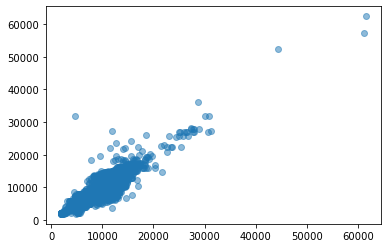

In [70]:
import matplotlib.pyplot as plt
plt.scatter(y_pred,y_test,alpha=0.5)
plt.show()

In [71]:
grid={'n_estimators':[x for x in range(1,1000,20)],
        'max_depth':[x for x in range(1,15,2)]}
from sklearn.model_selection import RandomizedSearchCV
rd=RandomizedSearchCV(estimator=model2,param_distributions=grid,cv=5,n_iter=10,n_jobs=-1,scoring='r2')
            
           
           
           


In [72]:
rd.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_depth': [1, 3, 5, 7, 9, 11, 13],
                                        'n_estimators': [1, 21, 41, 61, 81, 101,
                                                         121, 141, 161, 181,
                                                         201, 221, 241, 261,
                                                         281, 301, 321, 341,
                                                         361, 381, 401, 421,
                                                         441, 461, 481, 501,
                                                         521, 541, 561, 581, ...]},
                   scoring='r2')

In [73]:
y_pred=rd.predict(x_test)

In [74]:
rd.best_params_

{'n_estimators': 801, 'max_depth': 13}

In [75]:
rd.score(x_test,y_test)

0.8622468694990992

In [76]:
rd.score(x_train,y_train)

0.9260591772332116

In [77]:
rd.best_score_

0.8038608820548218

In [78]:
x.columns


Index(['Total_Stops', 'dur_min', 'dep_hr', 'dep_min', 'arr_hr', 'arr_min',
       'journey_date_date', 'journey_date_month', 'Banglore', 'Chennai',
       'Delhi', 'Kolkata', 'Mumbai', 'Banglore', 'Cochin', 'Delhi',
       'Hyderabad', 'Kolkata', 'New Delhi', 'Air India', 'GoAir', 'IndiGo',
       'Jet Airways', 'Jet Airways Business', 'Multiple carriers',
       'Multiple carriers Premium economy', 'SpiceJet', 'Trujet', 'Vistara',
       'Vistara Premium economy'],
      dtype='object')

In [79]:
def predict(stops,dephr,depmn,arrhr,arrmn,jrdate,jrmnth,source,dest,airline):
    sour_index=np.where(x.columns==source)[0][0]
    dest_index=np.where(x.columns==dest)[0][0]
    airl_index=np.where(x.columns==airline)[0][0]
    z=np.zeros(len(x.columns))
    z[0]=stops
    z[2]=dephr
    z[3]=depmn
    z[4]=arrhr
    z[5]=arrmn
    z[6]=jrdate
    z[7]=jrmnth
    if sour_index>=0 and dest_index>=0 and airl_index>=0:
        z[sour_index]=1
        z[dest_index]=1
        z[airl_index]=1
    return rd.predict([z])[0]
    

In [80]:
predict(2,18,20,22,20,13,8,'Delhi','Banglore','IndiGo')

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


6860.4612134929675

In [81]:
len(x.columns)

30

In [84]:
import pickle
with open('flight_fare_prediction.pickle','wb') as f:
    pickle.dump(rd,f)


In [85]:
with open('input_flight_fare.pickle','wb') as j:
    pickle.dump(x,j)